# Introduction to Astropy

Astropy is a Python library designed for astronomy and astrophysics. It's a robust and well documented tool for 
- Handing units and constants
- Working with astronomical coordinates.
- Manipulating and visualising FITS files.

```pip install astropy```

Use this command to install the library.

## astropy.units

This module is designed to handle physical quantities with associated units. it allows for clear, consistent and accurate handing of units in calculations reducing the risk of errors due to unit mismatches.

Supports arithmetic operations on units, create composite units like m/s or kg.m/s^2

Allows easy conversion between compatible units. (It actually raises an error if you try to convert kg to meters.)

Documentation - https://docs.astropy.org/en/stable/units/index.html

In [5]:
import numpy as np
import astropy.units as u

In [2]:
u.m

Unit("m")

In [3]:
2 * u.m

<Quantity 2. m>

In [4]:
r = 2*u.m
d = 2*r

In [5]:
d.value

4.0

In [6]:
u.s.physical_type

PhysicalType('time')

In [7]:
u.newton.decompose()

Unit("kg m / s2")

In [8]:
u.L

Unit("l")

In [9]:
u.Joule

Unit("J")

In [10]:
u.Joule.decompose()

Unit("m2 kg / s2")

In [11]:
u.Joule.physical_type

PhysicalType({'energy', 'torque', 'work'})

In [12]:
u.Joule.find_equivalent_units()

Primary name,Unit definition,Aliases
J,m2 kg / s2,"Joule, joule"
Ry,2.17987e-18 m2 kg / s2,rydberg
eV,1.60218e-19 m2 kg / s2,electronvolt
erg,1e-07 m2 kg / s2,
foe,1e+44 m2 kg / s2,"Bethe, bethe"


In [13]:
u.Joule.to(u.foe)

1e-44

In [14]:
u.newton.find_equivalent_units()

Primary name,Unit definition,Aliases
N,kg m / s2,"Newton, newton"
dyn,1e-05 kg m / s2,dyne


In [15]:
u.m.find_equivalent_units()

Primary name,Unit definition,Aliases
AU,1.49598e+11 m,"au, astronomical_unit"
Angstrom,1e-10 m,"AA, angstrom"
cm,0.01 m,centimeter
earthRad,6.3781e+06 m,"R_earth, Rearth"
jupiterRad,7.1492e+07 m,"R_jup, Rjup, R_jupiter, Rjupiter"
lsec,2.99792e+08 m,lightsecond
lyr,9.46073e+15 m,lightyear
m,irreducible,meter
micron,1e-06 m,
pc,3.08568e+16 m,parsec


In [16]:
u.G.decompose()

Unit("0.0001 kg / (A s2)")

In [2]:
import astropy.constants as const

In [18]:
r = u.R_earth
v = np.sqrt(const.G*u.M_earth/r)
v.decompose()
v.to(u.km/u.day)

<Quantity 683025.54345089 km / d>

In [19]:
u.sday.to(u.min) # Actual rotation period of earth

1436.0681755

### Composite Units
Created using numeric operators `*`, `/`, `**`

In [20]:
u.km/u.s

Unit("km / s")

In [21]:
s = 6*u.kg*u.m/u.s**2

In [22]:
s

<Quantity 6. kg m / s2>

In [23]:
u.Jansky.decompose()

Unit("1e-26 kg / s2")

In [24]:
u.Jansky.find_equivalent_units()

Primary name,Unit definition,Aliases
AB,3.63078e-23 kg / s2,ABflux
Jy,1e-26 kg / s2,"Jansky, jansky"


## Luminosity and flux density

Luminosity represents the total power emitted by the source over all directions in space. It is derived from flux density, distance and bandwidth of the source.

Flux density measures how much power per unit area per unit frequency is received by the observer. 
$$1\;Jansky = 10^{-26}\;W\;m^{-2}\;Hz^{-1}$$

Luminosity is related to flux density and distance as $$L=4\pi r^2S\Delta\nu$$

Here $4\pi r^2$ represents the surface area of sphere with radius $r$. This term scales the flux density from the observer's measurement to the total power over all directions.

$S$ is the flux density which quantifies the power received per unit area per unit frequency at the observer's location.

$\Delta\nu$ is the bandwidth over which the flux density is measured.

[Source](https://en.wikipedia.org/wiki/Luminosity#:~:text=The%20luminosity%20of%20a%20radio,m%E2%88%922%20Hz%E2%88%921.)

In [25]:
luminosity = 4*np.pi*(0.1*u.Gpc)**2*(5*u.Jansky)*(500*u.MHz)

In [26]:
luminosity

<Quantity 314.15926536 Gpc2 Jy MHz>

In [27]:
luminosity.decompose()

<Quantity 2.99123796e+33 m2 kg / s3>

In [28]:
u.W.decompose()

Unit("m2 kg / s3")

In [29]:
u.erg.decompose()

Unit("1e-07 m2 kg / s2")

In [30]:
luminosity.to(u.erg/u.s)

<Quantity 2.99123796e+40 erg / s>

In [31]:
distances = [4, 2.8, 9.2]*(u.km/u.s)

In [32]:
distances

<Quantity [4. , 2.8, 9.2] km / s>

In [33]:
distances*2

<Quantity [ 8. ,  5.6, 18.4] km / s>

In [34]:
distances[0]

<Quantity 4. km / s>

In [35]:
distances.to(u.au/u.s)

<Quantity [2.67383485e-08, 1.87168439e-08, 6.14982015e-08] AU / s>

In [36]:
u.J.decompose()

Unit("m2 kg / s2")

In [37]:
u.J.decompose(u.cgs.bases)

Unit("1e+07 cm2 g / s2")

In [38]:
u.cgs.bases

{Unit("K"),
 Unit("cd"),
 Unit("cm"),
 Unit("g"),
 Unit("mol"),
 Unit("rad"),
 Unit("s")}

In [39]:
u.si.bases

{Unit("A"),
 Unit("K"),
 Unit("cd"),
 Unit("kg"),
 Unit("m"),
 Unit("mol"),
 Unit("rad"),
 Unit("s")}

In [40]:
u.A.physical_type

PhysicalType('electrical current')

In [41]:
u.Watt.decompose(u.cgs.bases)

Unit("1e+07 cm2 g / s3")

In [42]:
u.cd.decompose(u.cgs.bases)

Unit("cd")

In [43]:
((7*u.m)/(7*u.km)).decompose()

<Quantity 0.001>

In [44]:
u.MHz.decompose()

Unit("1e+06 / s")

## Astropy Integrates with NumPy

In [45]:
np.sin(30)

-0.9880316240928618

In [46]:
np.sin(np.deg2rad(30))

0.49999999999999994

In [47]:
np.sin(30*u.degree)

<Quantity 0.5>

In [48]:
np.sqrt(4*u.kg * 9*u.kg)

<Quantity 6. kg>

In [49]:
a = np.linspace(1,15,5)

In [50]:
a=a*u.kg

In [51]:
a[0]

<Quantity 1. kg>

In [52]:
for i in a:
    print(i)

1.0 kg
4.5 kg
8.0 kg
11.5 kg
15.0 kg


Limitations for using quantities with numpy - [Quantity Known Issues](https://docs.astropy.org/en/stable/known_issues.html#quantities-lose-their-units-with-some-operations).

# astropy.constants

In [53]:
from astropy import constants as const

In [54]:
const.G

<<class 'astropy.constants.codata2018.CODATA2018'> name='Gravitational constant' value=6.6743e-11 uncertainty=1.5e-15 unit='m3 / (kg s2)' reference='CODATA 2018'>

In [55]:
print(const.G)

  Name   = Gravitational constant
  Value  = 6.6743e-11
  Uncertainty  = 1.5e-15
  Unit  = m3 / (kg s2)
  Reference = CODATA 2018


In [56]:
const.kpc

<<class 'astropy.constants.iau2015.IAU2015'> name='Kiloparsec' value=3.0856775814913675e+19 uncertainty=0.0 unit='m' reference='Derived from au + IAU 2015 Resolution B 2 note [4]'>

In [57]:
(1*u.kpc).decompose()

<Quantity 3.08567758e+19 m>

In [58]:
print(const.c)

  Name   = Speed of light in vacuum
  Value  = 299792458.0
  Uncertainty  = 0.0
  Unit  = m / s
  Reference = CODATA 2018


In [59]:
const.M_jup

<<class 'astropy.constants.iau2015.IAU2015'> name='Jupiter mass' value=1.8981245973360505e+27 uncertainty=4.26589589320839e+22 unit='kg' reference='IAU 2015 Resolution B 3 + CODATA 2018'>

In [60]:
print(const.M_jup)

  Name   = Jupiter mass
  Value  = 1.8981245973360505e+27
  Uncertainty  = 4.26589589320839e+22
  Unit  = kg
  Reference = IAU 2015 Resolution B 3 + CODATA 2018


These constants are quantities and can be converted to equivalent units

In [61]:
# Angular speed of an asteroid

d_e = 1 * u.AU
d_a = 3.8 * u.AU

# Calculate orbital velocities
v_a = (np.sqrt(const.G * const.M_sun / d_a)).to(u.km/u.s)
v_e = (np.sqrt(const.G * const.M_sun / d_e)).to(u.km/u.s)

# Calculate angular speed
angular_speed = ((v_e - v_a) / (d_e - d_a) * u.rad).to(u.arcsec / u.minute)
print(f"Angular speed: {angular_speed}")

Angular speed: -0.428572859561152 arcsec / min


# Equivalencies

https://docs.astropy.org/en/stable/units/equivalencies.html

Equivalencies are used to convert between different representations of the same physical quantity.  
For example if we try converting grams to eV using the astropy's `.to()` method, then it will throw an error as the units are not compatible. But we know that mass energy equivalence can be used to convert mass to energy.


In [62]:
const.m_e

<<class 'astropy.constants.codata2018.CODATA2018'> name='Electron mass' value=9.1093837015e-31 uncertainty=2.8e-40 unit='kg' reference='CODATA 2018'>

In [63]:
(const.m_e).to(u.MeV,u.mass_energy())

<Quantity 0.51099895 MeV>

In [64]:
(0.8*u.arcsec).to(u.parsec,equivalencies = u.parallax())

<Quantity 1.25 pc>

In [65]:
z = 0.4*u.dimensionless_unscaled
z.to(u.km/u.s,u.doppler_redshift())

<Quantity 97229.98637838 km / s>

In [66]:
wavelength = 500 *u.nm
freq = wavelength.to(u.Hz,equivalencies=u.spectral())
freq

<Quantity 5.99584916e+14 Hz>

In [67]:
u.Hz.find_equivalent_units()

Primary name,Unit definition,Aliases
Bq,1 / s,becquerel
Ci,3.7e+10 / s,curie
Hz,1 / s,"Hertz, hertz"


In [68]:
u.Hz.find_equivalent_units(equivalencies=u.spectral())

Primary name,Unit definition,Aliases
AU,1.49598e+11 m,"au, astronomical_unit"
Angstrom,1e-10 m,"AA, angstrom"
Bq,1 / s,becquerel
Ci,3.7e+10 / s,curie
Hz,1 / s,"Hertz, hertz"
J,m2 kg / s2,"Joule, joule"
Ry,2.17987e-18 m2 kg / s2,rydberg
cm,0.01 m,centimeter
eV,1.60218e-19 m2 kg / s2,electronvolt
earthRad,6.3781e+06 m,"R_earth, Rearth"


In [69]:
th = 0.025 * u.arcsec

rad = th.to(u.radian)
rad

<Quantity 1.2120342e-07 rad>

In [70]:
th.to(u.parsec, equivalencies=u.parallax()).to(u.AU).to(u.lightyear)

<Quantity 130.46255109 lyr>

In [71]:
u.rad.to(u.arcminute)

3437.7467707849396

# astropy.coordinates

In [72]:
from astropy import units as u
from astropy.coordinates import SkyCoord
from astropy.coordinates import EarthLocation
from astroquery.ipac.irsa import Irsa

In [73]:
pleiades = SkyCoord(ra=56.85, dec=24.1167,frame='icrs',unit='deg')

In [74]:
pleiades

<SkyCoord (ICRS): (ra, dec) in deg
    (56.85, 24.1167)>

The SkyCoord accepts coordinates in hourangle,hmsdms format and degrees format.

In [75]:
# Pleiades coordinates in hourangle (RA) and degrees (Dec)
ra_hms = '03h 47m 24s'
dec_dms = '+24d07m00s'

# Convert to degrees
pleiades_coord = SkyCoord(ra=ra_hms, dec=dec_dms, frame='icrs')
ra_deg = pleiades_coord.ra.deg  # Right Ascension in degrees
dec_deg = pleiades_coord.dec.deg  # Declination in degrees

print(f"RA in degrees: {ra_deg}")
print(f"Dec in degrees: {dec_deg}")

# Create a SkyCoord object with degrees
pleiades_deg_coord = SkyCoord(ra=ra_deg * u.deg, dec=dec_deg * u.deg, frame='icrs')

# Output the SkyCoord objects
print(f"SkyCoord (hms, dms): {pleiades_coord}")
print(f"SkyCoord (degrees): {pleiades_deg_coord}")

RA in degrees: 56.849999999999994
Dec in degrees: 24.116666666666667
SkyCoord (hms, dms): <SkyCoord (ICRS): (ra, dec) in deg
    (56.85, 24.11666667)>
SkyCoord (degrees): <SkyCoord (ICRS): (ra, dec) in deg
    (56.85, 24.11666667)>


In [76]:
pleiades_center = SkyCoord.from_name('Pleiades')

In [77]:
pleiades_center

<SkyCoord (ICRS): (ra, dec) in deg
    (56.601, 24.114)>

In [78]:
aldebaran = SkyCoord.from_name('Aldebaran')

In [79]:
separation = pleiades_center.separation(aldebaran)
print(separation)
print(f"Angular separation between Pleiades and Aldebaran: {separation.to(u.deg):.2f}")

13d51m57.69276444s
Angular separation between Pleiades and Aldebaran: 13.87 deg


In [80]:
separation = SkyCoord.from_name('Spica').separation(SkyCoord.from_name('Arcturus'))
separation

<Angle 32.79285138 deg>

In [81]:
SkyCoord.from_name('alpha Leonis')

<SkyCoord (ICRS): (ra, dec) in deg
    (152.09296244, 11.96720878)>

In [82]:
SkyCoord.from_name('regulus')

<SkyCoord (ICRS): (ra, dec) in deg
    (152.09296244, 11.96720878)>

In [83]:
mizar = SkyCoord(ra="13h23m55.5s", dec="+54d55m31s", distance=24.0*u.pc, frame="icrs")
alcor = SkyCoord(ra="13h25m13.5s", dec="+54d59m16s", distance=24.9*u.pc, frame="icrs")


angular_sep = mizar.separation(alcor)
print(f"Angular separation between Mizar and Alcor: {angular_sep.to(u.arcmin):.2f}")

# Calculate 3D separation
cartesian_mizar = mizar.cartesian
cartesian_alcor = alcor.cartesian

# Compute 3D distance
separation_3d = np.sqrt(
    (cartesian_mizar.x - cartesian_alcor.x)**2 +
    (cartesian_mizar.y - cartesian_alcor.y)**2 +
    (cartesian_mizar.z - cartesian_alcor.z)**2
)
print(f"3D separation between Mizar and Alcor: {separation_3d.to(u.pc):.2f}")

Angular separation between Mizar and Alcor: 11.81 arcmin
3D separation between Mizar and Alcor: 0.90 pc


In [84]:
from astropy.coordinates import SkyCoord
import astropy.units as u


mizar = SkyCoord(ra="13h23m55.5s", dec="+54d55m31s", distance=24.0 * u.pc, frame="icrs")
alcor = SkyCoord(ra="13h25m13.5s", dec="+54d59m16s", distance=24.9 * u.pc, frame="icrs")

angular_sep = mizar.separation(alcor)
print(f"Angular separation between Mizar and Alcor: {angular_sep.to(u.arcmin):.2f}")

# 3D separation using the separation_3d method
separation_3d = mizar.separation_3d(alcor)
print(f"3D separation between Mizar and Alcor: {separation_3d.to(u.pc):.2f}")


Angular separation between Mizar and Alcor: 11.81 arcmin
3D separation between Mizar and Alcor: 0.90 pc


In [85]:
# Skycoord also accepts array of coordinates

c = SkyCoord(ra=[10, 11, 12, 13]*u.degree, dec=[41, -5, 42, 0]*u.degree)

c

<SkyCoord (ICRS): (ra, dec) in deg
    [(10., 41.), (11., -5.), (12., 42.), (13.,  0.)]>

In [86]:
p = SkyCoord(ra=56.85, dec=24.1167,frame='icrs',unit='deg')

In [87]:
p.ra

<Longitude 56.85 deg>

In [88]:
p.ra.hour

3.790000000000001

In [89]:
p.ra.hms

hms_tuple(h=3.0, m=47.0, s=24.000000000003325)

In [90]:
p.dec

<Latitude 24.1167 deg>

In [91]:
p.dec.dms

dms_tuple(d=24.0, m=7.0, s=0.12000000000568889)

In [92]:
p.dec.degree

24.1167

In [93]:
p.cartesian.x

<Quantity 0.49910257>

In [94]:
p.cartesian.y

<Quantity 0.76416328>

In [95]:
p_galactic = p.galactic
p_galactic

<SkyCoord (Galactic): (l, b) in deg
    (166.64421262, -23.45968294)>

In [96]:
print(p)
print(p_galactic)

<SkyCoord (ICRS): (ra, dec) in deg
    (56.85, 24.1167)>
<SkyCoord (Galactic): (l, b) in deg
    (166.64421262, -23.45968294)>


In [97]:
alpheratz = SkyCoord.from_name('alpheratz')
alpheratz

<SkyCoord (ICRS): (ra, dec) in deg
    (2.09691619, 29.09043112)>

In [98]:
alpheratz.galactic

<SkyCoord (Galactic): (l, b) in deg
    (111.73222782, -32.84335675)>

In [99]:
m31 = SkyCoord.from_name('m31')
print(m31)
print(m31.galactic)

<SkyCoord (ICRS): (ra, dec) in deg
    (10.6847083, 41.26875)>
<SkyCoord (Galactic): (l, b) in deg
    (121.17432904, -21.5733088)>


In [100]:
m13 = SkyCoord.from_name('m13')
print(m13)
print(m13.galactic)

<SkyCoord (ICRS): (ra, dec) in deg
    (250.423475, 36.4613194)>
<SkyCoord (Galactic): (l, b) in deg
    (59.00947455, 40.91176144)>


In [101]:
a_s = SkyCoord.from_name('alpha sagittarii')
a_s

<SkyCoord (ICRS): (ra, dec) in deg
    (290.97156416, -40.6159372)>

In [102]:
a_g = a_s.galactic

In [103]:
a_g = SkyCoord(l=0*u.deg,b=90*u.deg,frame='galactic')

In [104]:
a_g

<SkyCoord (Galactic): (l, b) in deg
    (0., 90.)>

In [105]:
a_g.icrs

<SkyCoord (ICRS): (ra, dec) in deg
    (192.85947789, 27.12825241)>

In [106]:
SkyCoord.from_name('m80')

<SkyCoord (ICRS): (ra, dec) in deg
    (244.260042, -22.976083)>

## Planning observations


In [107]:
from astropy.coordinates import AltAz
from astropy.time import Time
import matplotlib.pyplot as plt
import numpy as np

In [108]:
hanle = EarthLocation.of_site('Indian Astronomical Observatory')

In [109]:
hanle

<EarthLocation (1028235.76656849, 5272208.285242, 3435855.36298371) m>

In [110]:
obstime = Time('2024-06-01 1:00:00')

In [111]:
from astropy.coordinates import AltAz

altaz = AltAz(location=hanle, obstime=obstime)

In [112]:
altaz

<AltAz Frame (obstime=2024-06-01 01:00:00.000, location=(1028235.76656849, 5272208.285242, 3435855.36298371) m, pressure=0.0 hPa, temperature=0.0 deg_C, relative_humidity=0.0, obswl=1.0 micron)>

In [113]:
p.transform_to(altaz)

<SkyCoord (AltAz: obstime=2024-06-01 01:00:00.000, location=(1028235.76656849, 5272208.285242, 3435855.36298371) m, pressure=0.0 hPa, temperature=0.0 deg_C, relative_humidity=0.0, obswl=1.0 micron): (az, alt) in deg
    (76.97474021, 26.303495)>

explain airmass
extinction factor
altaz


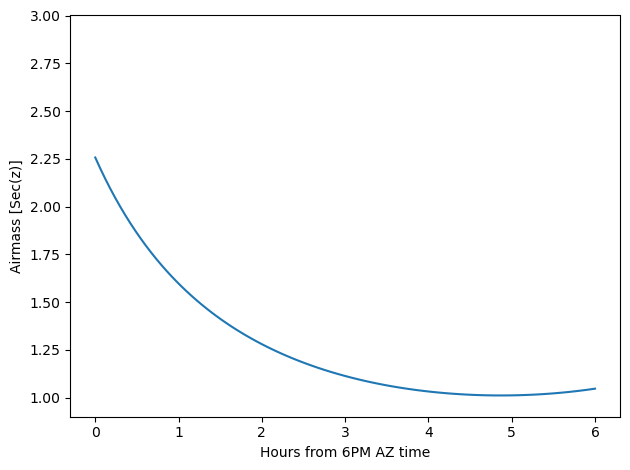

In [114]:
import matplotlib.pyplot as plt

delta_hours = np.linspace(0, 6, 100)*u.hour
full_night_times = obstime + delta_hours
full_night_altaz = AltAz(location=hanle, obstime=full_night_times)
full_night_altaz_coords = p.transform_to(full_night_altaz)

plt.plot(delta_hours, full_night_altaz_coords.secz)
plt.xlabel('Hours from 6PM AZ time')
plt.ylabel('Airmass [Sec(z)]')
plt.ylim(0.9, 3)
plt.tight_layout()

# FITS Files: Basics and Key Concepts

## What Are FITS Files?

FITS (Flexible Image Transport System) files are the standard format for storing and exchanging astronomical data. Developed by NASA, FITS files are widely used in astronomy to store:

- Images (e.g., from telescopes)
- Spectra
- Tables of data
- Metadata (e.g., observational details, instrument settings)

FITS files consist of one or more **Header Data Units (HDUs)** that store data and metadata.

---

## Key Components of FITS Files

### **1. Header Data Unit (HDU)**
An HDU is the fundamental building block of a FITS file. Each HDU contains:
- **Header**: ASCII metadata in key-value pairs describing the data (e.g., dimensions, data type, observation time).
- **Data**: Binary data, often an image or a table.

The first HDU in a FITS file is called the **Primary HDU**, which may contain an image or be empty.
Subsequent HDUs are called **extensions** and can store additional images, tables, or other data structures.

### **2. Data**
The data section of an HDU contains the actual content, such as:
- Pixel values for images (2D arrays or higher-dimensional cubes).
- Rows and columns for tables.

---

## Accessing FITS Data in Python
When working with FITS files in Python (using `astropy.io.fits`), indexing and attributes play a critical role:

### **Indexing (0 and 1)**
- **Index 0**: Refers to the **Primary HDU**, the first HDU in the file.
  - Example: `hdu_list[0]`
- **Index 1**: Refers to the first extension HDU (if present).
  - Example: `hdu_list[1]`

### **HDU Object**
An HDU object has two key components:
1. **`header`**: Contains the metadata for the HDU.
   - Example: `hdu_list[0].header`
2. **`data`**: Contains the data array or table for the HDU.
   - Example: `hdu_list[0].data`

### **Examples**
```python
from astropy.io import fits

# Open a FITS file
hdu_list = fits.open('example.fits')

# Access Primary HDU
primary_hdu = hdu_list[0]

# Get metadata (header)
print(primary_hdu.header)

# Get image data
image_data = primary_hdu.data

# Access first extension HDU (if it exists)
extension_hdu = hdu_list[1]
```

---

## Summary of Terms

| Term        | Description                                                                 |
|-------------|-----------------------------------------------------------------------------|
| **FITS**    | File format for astronomical data, storing images, spectra, and tables.    |
| **HDU**     | Header Data Unit: Contains header (metadata) and data (content).           |
| **Header**  | ASCII key-value pairs describing the data and file properties.             |
| **Data**    | Binary content: image arrays, tables, or other data structures.            |
| **Index 0** | Refers to the Primary HDU in a FITS file.                                  |
| **Index 1** | Refers to the first extension HDU in a FITS file.                          |

---

FITS files are powerful and versatile, allowing astronomers to handle complex datasets efficiently. Understanding HDUs, headers, and data access is essential for working with FITS files effectively.



In [115]:
from astropy.io import fits

fits_file = fits.open('data/hlsp_hugs_hst_acs-wfc_ngc0104_f814w_v1_stack-0050s.fits')

image = fits_file[0].data
print(image)

[[-25. -25. -25. ... -25. -25. -25.]
 [-25. -25. -25. ... -25. -25. -25.]
 [-25. -25. -25. ... -25. -25. -25.]
 ...
 [-25. -25. -25. ... -25. -25. -25.]
 [-25. -25. -25. ... -25. -25. -25.]
 [-25. -25. -25. ... -25. -25. -25.]]


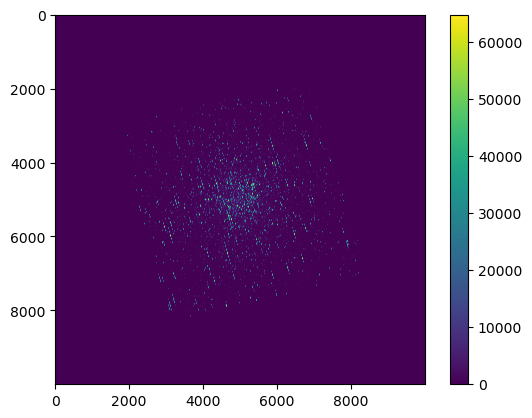

In [116]:
import matplotlib.pyplot as plt

plt.figure()
plt.imshow(image)
plt.colorbar()

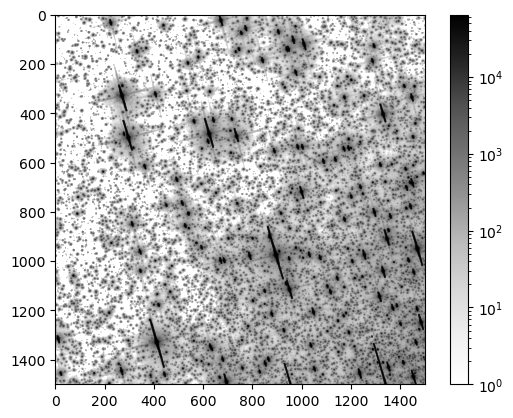

In [117]:
from matplotlib.colors import LogNorm

x_min, x_max = 3000, 4500
y_min, y_max = 3000, 4500

plt.figure()
plt.imshow(image[y_min:y_max,x_min:x_max],cmap='Greys',norm=LogNorm())
plt.colorbar()

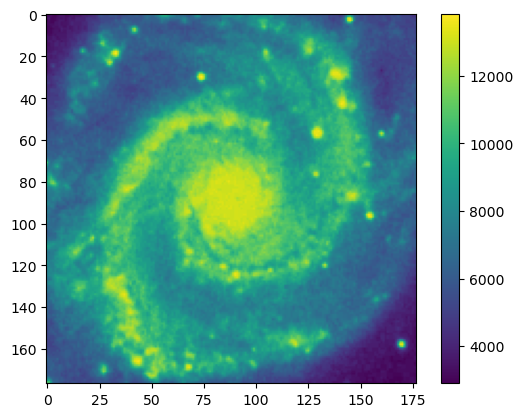

In [119]:
from astropy.io import fits

fits_file = fits.open('data/dss1.13.29.52.7+47.11.42.9.fits')

image = fits_file[0].data

plt.figure()
plt.imshow(image)
plt.colorbar()

In [120]:
fits_file[0].header

 [astropy.io.fits.verify]


SIMPLE  =                    T /FITS header                                     
BITPIX  =                   16 /No.Bits per pixel                               
NAXIS   =                    2 /No.dimensions                                   
NAXIS1  =                  177 /Length X axis                                   
NAXIS2  =                  177 /Length Y axis                                   
EXTEND  =                    T /                                                
DATE    = '25/12/24          ' /Date of FITS file creation                      
ORIGIN  = 'CASB -- STScI     ' /Origin of FITS image                            
PLTLABEL= 'E1593             ' /Observatory plate label                         
PLATEID = '07VR              ' /GSSS Plate ID                                   
REGION  = 'XE173             ' /GSSS Region Name                                
DATE-OBS= '08/04/56          ' /UT date of Observation                          
UT      = '09:25:00.00      

In [121]:
print(fits_file[1].header)

XTENSION= 'BINTABLE'           / binary table extension                         BITPIX  =                    8 / 8-bit bytes                                    NAXIS   =                    2 / 2-dimensional binary table                     NAXIS1  =                   28 / width of table in bytes                        NAXIS2  =                   16 / number of rows in table                        PCOUNT  =                    0 / size of special data area                      GCOUNT  =                    1 / one data group (required keyword)              TFIELDS =                    4 / number of fields in each row                   TTYPE1  = 'INTEGRATED_SIGNAL'  / label for field   1                            TFORM1  = '1D      '           / data format of the field: 8-byte DOUBLE        TUNIT1  = 'log10Counts'        / physical unit of field                         TTYPE2  = 'MAGNITUDE'          / label for field   2                            TFORM2  = '1D      '           / data fo

In [122]:
fits_file[0]

In [124]:
from astropy.io import fits
from matplotlib.colors import LogNorm

fits_file = fits.open('data/chandra_events.fits')

image = fits_file[1].data

fits_file[0].header

SIMPLE  =                    T / file does conform to FITS standard             
BITPIX  =                   16 / number of bits per data pixel                  
NAXIS   =                    0 / number of data axes                            
EXTEND  =                    T / FITS dataset may contain extensions            
COMMENT   FITS (Flexible Image Transport System) format is defined in 'Astronomy
COMMENT   and Astrophysics', volume 376, page 359; bibcode: 2001A&A...376..359H 
HDUNAME = 'PRIMARY '                                                            
COMMENT   FITS (Flexible Image Transport System) format is defined in 'Astronomy
COMMENT   and Astrophysics', volume 376, page 359; bibcode: 2001A&A...376..359H 
ORIGIN  = 'ASC     '           / Source of FITS file                            
CREATOR = 'cxc - Version DS 8.5' / tool that created this output                
CHECKSUM= 'ecnIhclGeclGeclG'   / HDU checksum updated 2012-12-26T17:20:09       
DATASUM = '        '        

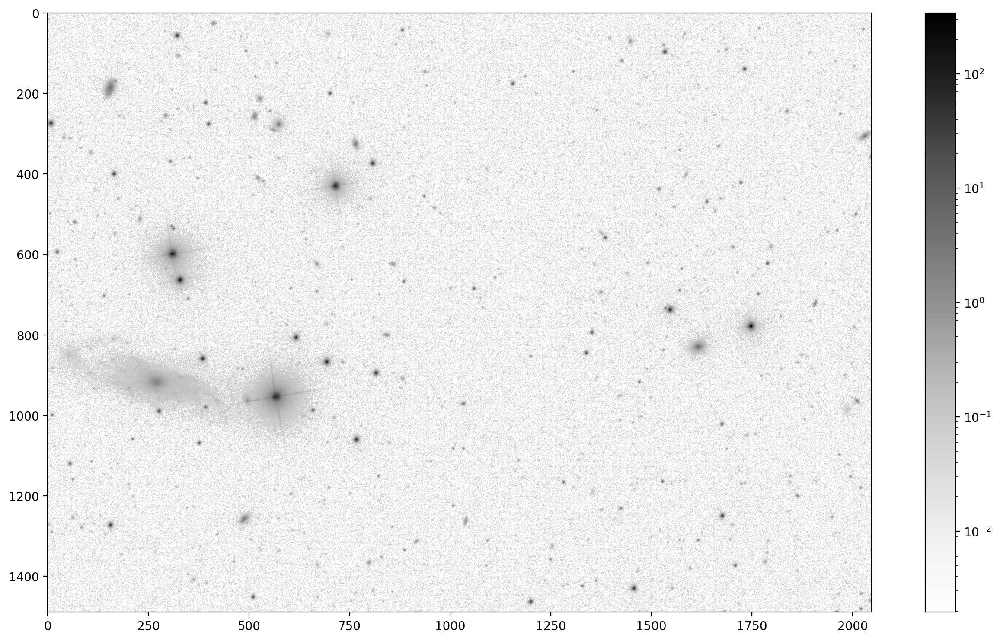

In [127]:
from astropy.io import fits
from matplotlib.colors import LogNorm

fits_file = fits.open('data/frame-i-001231-5-0053.fits')

image = fits_file[0].data

plt.figure(figsize=(16,9),dpi=200)
plt.imshow(image,cmap='Greys',norm=LogNorm())
plt.colorbar()

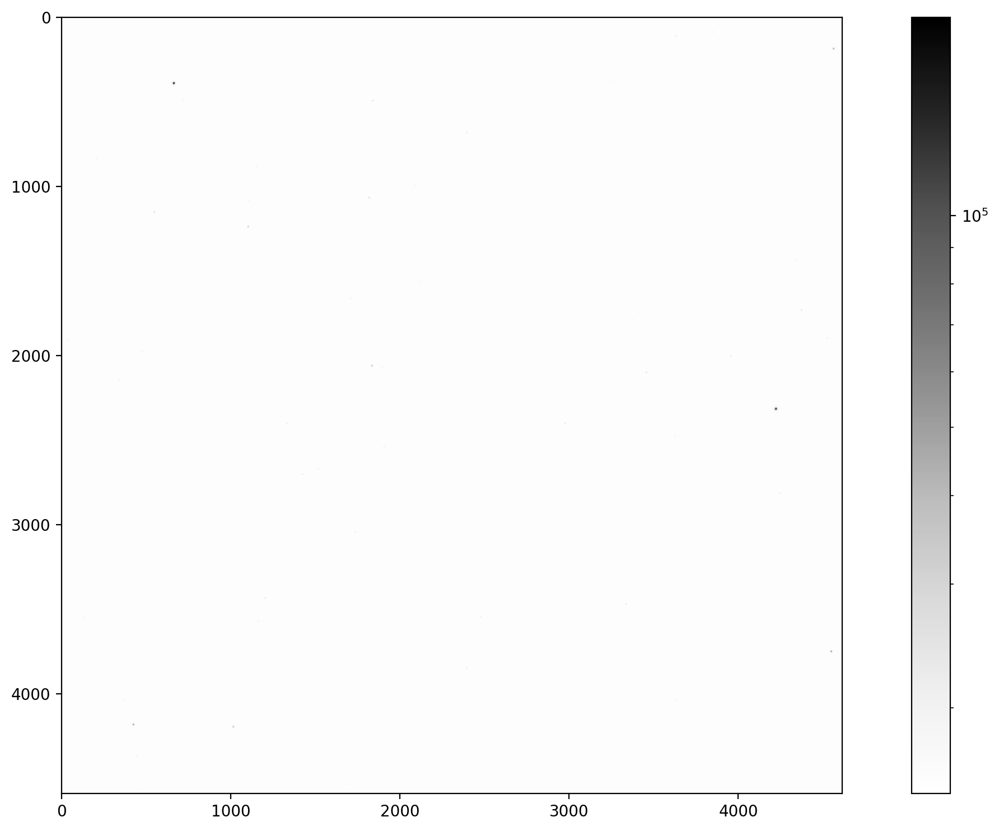

In [128]:
from astropy.io import fits
from matplotlib.colors import LogNorm

fits_file = fits.open('data/ADP.2024-10-08T07_59_34.482.fits')

image = fits_file[0].data

plt.figure(figsize=(16,9),dpi=200)
plt.imshow(image,cmap='Greys',norm=LogNorm())
plt.colorbar()

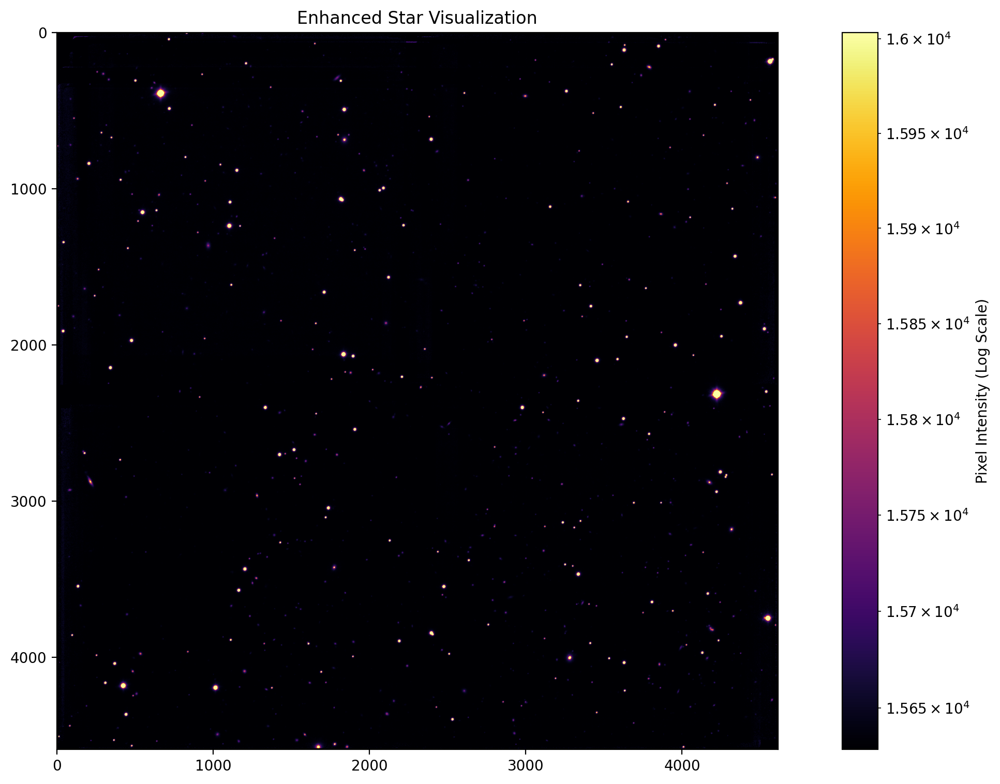

In [129]:
from astropy.io import fits
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import numpy as np

# Load the FITS file
fits_file = fits.open('data/ADP.2024-10-08T07_59_34.482.fits')
image = fits_file[0].data

# Exclude non-finite values
image = np.nan_to_num(image, nan=0.0)

# Set custom limits to enhance the stars' brightness
vmin = np.percentile(image, 50)  # Lower cutoff
vmax = np.percentile(image, 99.9)  # Upper cutoff

# Plot the image
plt.figure(figsize=(16, 9), dpi=200)
plt.imshow(image, cmap='inferno', norm=LogNorm(vmin=vmin, vmax=vmax))
plt.colorbar(label='Pixel Intensity (Log Scale)')
plt.title('Enhanced Star Visualization')
plt.show()


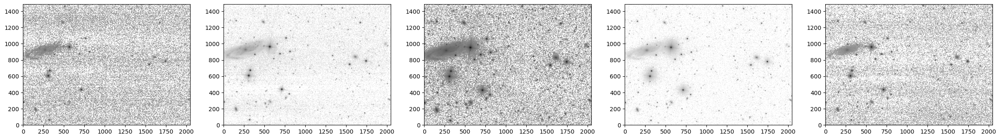

In [138]:
from astropy.io import fits
from matplotlib.colors import LogNorm

u = fits.open('data/frame-u-001231-5-0053.fits')
g = fits.open('data/frame-g-001231-5-0053.fits')
r = fits.open('data/frame-r-001231-5-0053.fits')
i = fits.open('data/frame-i-001231-5-0053.fits')
z = fits.open('data/frame-z-001231-5-0053.fits')

u_image = u[0].data
g_image = g[0].data
r_image = r[0].data
i_image = i[0].data
z_image = z[0].data


fig,ax = plt.subplots(1,5,figsize=(30,10))

ax[0].imshow(u_image,cmap='Greys',norm=LogNorm(),origin='lower')
ax[1].imshow(g_image,cmap='Greys',norm=LogNorm(),origin='lower')
ax[2].imshow(r_image,cmap='Greys',norm=LogNorm(),origin='lower')
ax[3].imshow(i_image,cmap='Greys',norm=LogNorm(),origin='lower')
ax[4].imshow(z_image,cmap='Greys',norm=LogNorm(),origin='lower')

plt.show()


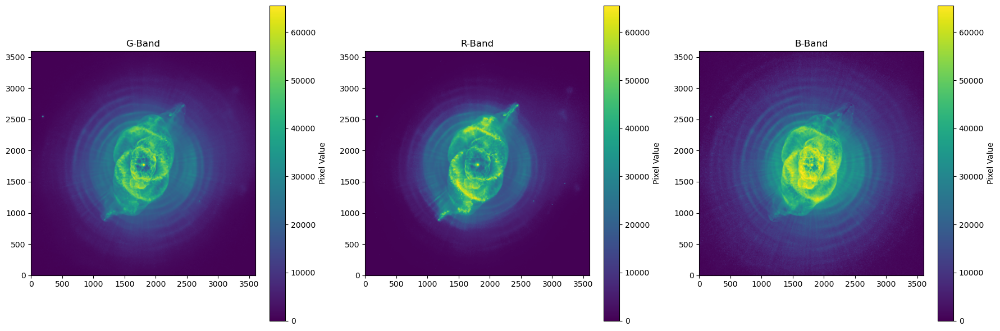

In [139]:
import matplotlib.pyplot as plt
from astropy.io import fits
from matplotlib.colors import LogNorm

# File paths for the three bands
g_file = 'data/ngc6543_optical_G.fits'
r_file = 'data/ngc6543_optical_R.fits'
b_file = 'data/ngc6543_optical_B.fits'

# Open FITS files and load data
g_data = fits.open(g_file)[0].data
r_data = fits.open(r_file)[0].data
b_data = fits.open(b_file)[0].data

# Create a figure with subplots
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Plot each band in a subplot
bands = {'G': g_data, 'R': r_data, 'B': b_data}
for ax, (label, data) in zip(axes, bands.items()):
    im = ax.imshow(data,origin='lower')
    ax.set_title(f"{label}-Band")
    plt.colorbar(im, ax=ax, orientation='vertical', label="Pixel Value")

# Adjust layout
plt.tight_layout()
plt.show()


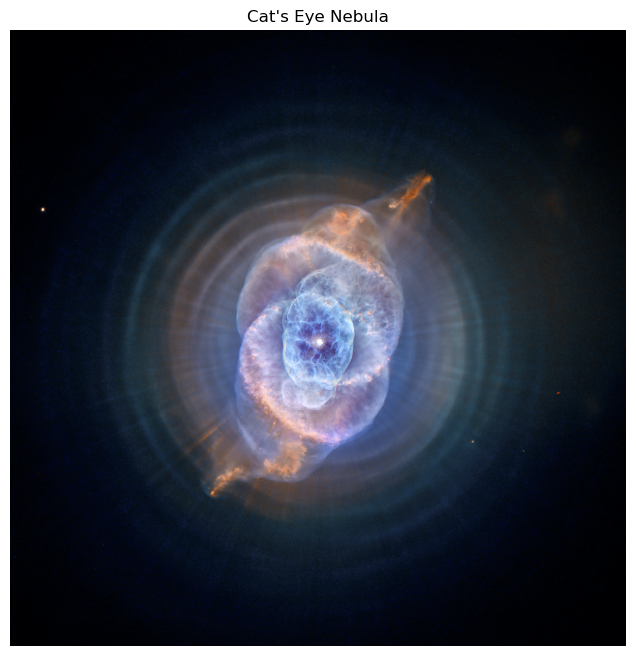

In [140]:
# Import necessary libraries
from astropy.io import fits  # For handling FITS files, a common format for astronomical data
import numpy as np  # For numerical operations
import matplotlib.pyplot as plt  # For plotting images

# Paths to FITS files for the different optical filters (G, R, B)
g_file = "data/ngc6543_optical_G.fits"  # Green filter data file
r_file = "data/ngc6543_optical_R.fits"  # Red filter data file
i_file = "data/ngc6543_optical_B.fits"  # Blue filter data file (or replace with 'z_filter.fits' for blue)

# Open and read the data from the FITS files using Astropy
# Each filter file is opened and the data is extracted
with fits.open(g_file) as g_hdul, fits.open(r_file) as r_hdul, fits.open(i_file) as i_hdul:
    g_data = g_hdul[0].data  # Green filter data (2D array of pixel values)
    r_data = r_hdul[0].data  # Red filter data
    i_data = i_hdul[0].data  # Blue filter data (or the alternative z_filter data)

# Define a function to normalize the data
def normalize(data, scale_min=0, scale_max=1):
    """Normalize data to a range between scale_min and scale_max."""
    # Find the minimum and maximum values in the data
    data_min = np.min(data)  # Minimum value in the data
    data_max = np.max(data)  # Maximum value in the data
    # Scale the data so that it fits between scale_min and scale_max
    return (data - data_min) / (data_max - data_min) * (scale_max - scale_min) + scale_min

# Normalize the data for each color filter (green, red, blue)
r_norm = normalize(r_data)  # Normalize red filter data
g_norm = normalize(g_data)  # Normalize green filter data
i_norm = normalize(i_data)  # Normalize blue filter data (or use z_norm if using z_filter)

# Create an empty image array to store the RGB image
# The image has the same height and width as the original filter data but with 3 color channels (RGB)
rgb_image = np.zeros((r_norm.shape[0], r_norm.shape[1], 3))  # 3 channels for RGB
# Try printing the empty image array and see how it works. Check its shape and dimensions - print(rgb_image)

# Assign the normalized filter data to the corresponding color channels in the RGB image
rgb_image[:, :, 0] = r_norm  # Red channel (using the normalized red data)
rgb_image[:, :, 1] = g_norm  # Green channel (using the normalized green data)
rgb_image[:, :, 2] = i_norm  # Blue channel (using the normalized blue data)

# Plot the RGB image using matplotlib
plt.figure(figsize=(8, 8))  # Set the size of the plot
plt.imshow(rgb_image,origin='lower', interpolation='nearest')  # Display the image (nearest interpolation for faster rendering)
plt.title("Cat's Eye Nebula")  # Set the title of the image
plt.axis("off")  # Turn off the axis labels (for a cleaner image)
plt.show()  # Show the image

# RGB images using the Lupton et al (2004) scheme

https://docs.astropy.org/en/stable/visualization/rgb.html#rgb-images-using-the-lupton-et-al-2004-scheme

Lupton et al. (2004) describe an “optimal” algorithm for producing red-green- blue composite images from three separate high-dynamic range arrays. This method is implemented in make_lupton_rgb() as a convenience wrapper function and an associated set of classes to provide alternate scalings.


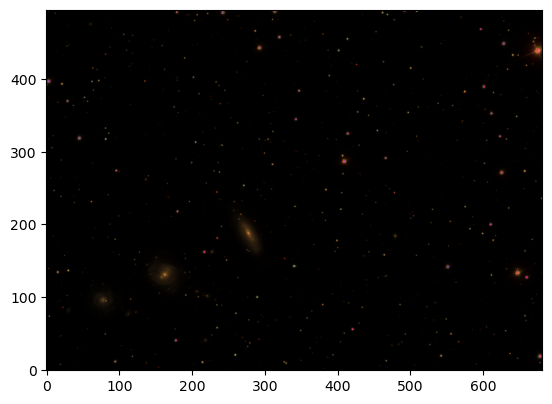

In [136]:
import matplotlib.pyplot as plt
from astropy.visualization import make_lupton_rgb
from astropy.io import fits
from astropy.utils.data import get_pkg_data_filename

# Read in the three images downloaded from here:
g_name = get_pkg_data_filename('visualization/reprojected_sdss_g.fits.bz2')
r_name = get_pkg_data_filename('visualization/reprojected_sdss_r.fits.bz2')
i_name = get_pkg_data_filename('visualization/reprojected_sdss_i.fits.bz2')
g = fits.getdata(g_name)
r = fits.getdata(r_name)
i = fits.getdata(i_name)

rgb_default = make_lupton_rgb(i, r, g, filename="ngc6976-default.jpeg")

plt.imshow(rgb_default, origin='lower')

`make_lupton_rgb(i,r,g)` this function takes three 2D arrays of image data and combines them into one single RGB image. It applies a specific transformation as given by Lupton's algorithm to the data to enhance the contrast, making the final image more visually appealing. It enhances the visibility of faint objects in astronomical images while reducing the dominance of brighter regions.

The keyword `origin=lower` in plt.imshow function controls the orientation of the image. In many astronomical images the origin (0,0) is at the top left, so it is useful to flip the image so that origin is in the bottom left as it's typically what we are used to. 

Furthermore, we can use `LogStretch` and `ManualInterval` classes from Astropy to create a logarithmic stretch RGB image of the three filters. This enhances the details in regions with low signal intensity. See image output of the code below.

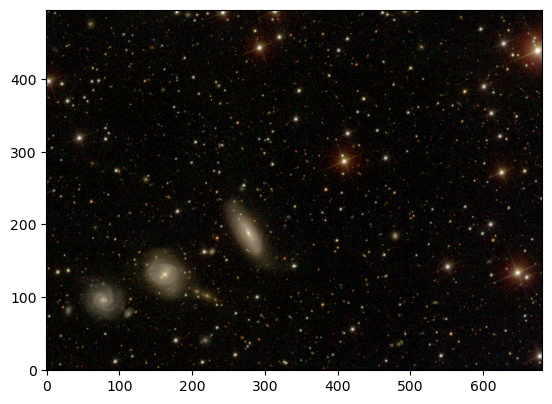

In [137]:
from astropy.visualization import LogStretch
from astropy.visualization import make_rgb, ManualInterval

# Use the maximum value of the 99.95% percentile over all three filters
# as the maximum value:
pctl = 99.95
maximum = 0.
for img in [i,r,g]:
    val = np.percentile(img,pctl)
    if val > maximum:
        maximum = val

rgb_log = make_rgb(i, r, g, interval=ManualInterval(vmin=0, vmax=maximum),
                   stretch=LogStretch(a=1000), filename="ngc6976-log.jpeg")
plt.imshow(rgb_log, origin='lower')

# References

## FITS Data Sources

- SDSS DR18 Homepage - https://dr18.sdss.org/
- SDSS Skyserver Navigation tool to fetch objects and download fits - https://skyserver.sdss.org/dr18/VisualTools/navi
- FITS data source for Chandra - https://chandra.harvard.edu/photo/openFITS/multiwavelength_data.html
- HUGS (Hubble UV Globular Cluster Survey) - https://archive.stsci.edu/prepds/hugs/
- ESO Archive - https://archive.eso.org/scienceportal/home
- FITS image used for demo in this notebook - https://archive.eso.org/dataset/ADP.2024-10-08T07:59:34.482

## Docs
- Lupton et al 2004 RGB Scheme - https://docs.astropy.org/en/stable/visualization/rgb.html#rgb-images-using-the-lupton-et-al-2004-scheme
- List of catalogs used in SkyCoord.from_name method - https://cds.unistra.fr/cgi-bin/Sesame
- Astropy Physical Types - https://docs.astropy.org/en/stable/units/physical_types.html#physical-types
- NASA FITS Standard - https://fits.gsfc.nasa.gov/fits_standard.html
- Astropy Workshop docs - https://github.com/astropy/astropy-workshop/blob/main/05-FITS/io_fits_ascii_overview.ipynb
- Astropy Coordinates - https://docs.astropy.org/en/stable/coordinates/index.html
- Astropy Cosmology Units - https://docs.astropy.org/en/stable/cosmology/units.html#module-astropy.cosmology.units
- Astropy known issues with using units with Numpy or Pandas - https://docs.astropy.org/en/stable/known_issues.html#quantities-lose-their-units-with-some-operations
- Astroquery to query Catelogs - https://astroquery.readthedocs.io/en/latest/ipac/irsa/irsa.html
- Astropy Equivalencies - https://docs.astropy.org/en/stable/units/equivalencies.html